In [1]:
import os, gc, shutil, subprocess, tempfile
from pathlib import Path
from datetime import datetime

import cv2
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision.transforms as T
from PIL import Image
from tqdm.auto import tqdm

from IPython.display import display, Image as IPyImage, Video

DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
print(f"Using device: {DEVICE}")
if DEVICE == "cuda":
    print(f"GPU: {torch.cuda.get_device_name(0)} \nVRAM: {torch.cuda.get_device_properties(0).total_memory/1e9:.1f} GB")

Using device: cuda
GPU: NVIDIA GeForce GTX 1050 Ti 
VRAM: 4.3 GB


In [2]:
SD_CKPT = Path(r"D:\AI\sd.webui\webui\models\Stable-diffusion\realisticVisionV60B1_v51HyperVAE.safetensors") # Please replace the path with your own checkpoint path
ADAPTER_CKPT = Path("vjepa_t2i_adapter_sd15_step4550.pt")

OUTPUT_DIR = Path("experiments/outputs")
OUTPUT_DIR.mkdir(parents=True, exist_ok=True)

IMG_SIZE = 384

In [3]:
vjepa_transform = T.Compose([
    T.Resize(IMG_SIZE, interpolation=T.InterpolationMode.BICUBIC),
    T.CenterCrop(IMG_SIZE),
    T.ToTensor(),
    T.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

In [4]:
class ResnetBlock(nn.Module):
    def __init__(self, channels: int):
        super().__init__()
        self.block = nn.Sequential(
            nn.GroupNorm(32, channels, eps=1e-6), nn.SiLU(),
            nn.Conv2d(channels, channels, 3, padding=1),
            nn.GroupNorm(32, channels, eps=1e-6), nn.SiLU(),
            nn.Conv2d(channels, channels, 3, padding=1),
        )
    def forward(self, x): return x + self.block(x)

class AdapterBlock(nn.Module):
    def __init__(self, in_channels, out_channels, num_res_blocks=2):
        super().__init__()
        self.in_conv = nn.Conv2d(in_channels, out_channels, 1)
        self.resnets = nn.Sequential(*[ResnetBlock(out_channels) for _ in range(num_res_blocks)])
    def forward(self, x): return self.resnets(self.in_conv(x))

class DownsampleBlock(nn.Module):
    def __init__(self, channels):
        super().__init__()
        self.conv = nn.Conv2d(channels, channels, 3, stride=2, padding=1)
    def forward(self, x): return self.conv(x)

class JEPAProjectionHead(nn.Module):
    def __init__(self, token_dim=1024, out_channels=320):
        super().__init__()
        self.reduce = nn.Conv2d(token_dim, 512, 1)
        self.refine = nn.Sequential(
            nn.GroupNorm(32, 512, eps=1e-6), nn.SiLU(),
            nn.Conv2d(512, out_channels, 3, padding=1),
            nn.GroupNorm(32, out_channels, eps=1e-6), nn.SiLU(),
        )
    def forward(self, x):
        B = x.shape[0]
        x = x.float().reshape(B, 24, 24, 1024).permute(0, 3, 1, 2)
        x = self.reduce(x)
        x = F.interpolate(x, size=(48, 48), mode='bilinear', align_corners=False)
        return self.refine(x)

class JEPAAdapter(nn.Module):
    def __init__(self, num_res_blocks=2):
        super().__init__()
        self.projection = JEPAProjectionHead(1024, 320)
        self.block0 = AdapterBlock(320, 320, num_res_blocks)
        self.block1 = AdapterBlock(320, 640, num_res_blocks)
        self.block2 = AdapterBlock(640, 1280, num_res_blocks)
        self.block3 = AdapterBlock(1280, 1280, num_res_blocks)
        self.down0 = DownsampleBlock(320)
        self.down1 = DownsampleBlock(640)
        self.down2 = DownsampleBlock(1280)

    def forward(self, jepa_emb):
        x = self.projection(jepa_emb)
        f0 = self.block0(x); x = self.down0(f0)
        f1 = self.block1(x); x = self.down1(f1)
        f2 = self.block2(x); x = self.down2(f2)
        f3 = self.block3(x)
        return [f0, f1, f2, f3]

In [5]:
_model_cache = {
    "vjepa_encoder": None,
    "adapter": None,
    "sd_components": None,
    "ckpt_hash": None,
}

def clear_cache():
    for k in ["vjepa_encoder", "adapter", "sd_components"]:
        if _model_cache[k]:
            if isinstance(_model_cache[k], dict):
                for m in _model_cache[k].values():
                    if hasattr(m, 'cpu'): m.cpu()
            elif hasattr(_model_cache[k], 'cpu'):
                _model_cache[k].cpu()
            _model_cache[k] = None
    gc.collect()
    torch.cuda.empty_cache()
    print("✓ Cache cleared")

In [6]:
from diffusers import StableDiffusionPipeline, LCMScheduler, DDIMScheduler

def load_vjepa():
    if _model_cache["vjepa_encoder"] is not None:
        return _model_cache["vjepa_encoder"].to(DEVICE)
    print("Loading V-JEPA 2.1...")
    encoder, _ = torch.hub.load('facebookresearch/vjepa2', 'vjepa2_1_vit_large_384')
    encoder.eval().to(DEVICE)
    for p in encoder.parameters(): p.requires_grad_(False)
    _model_cache["vjepa_encoder"] = encoder
    return encoder

def load_sd():
    if _model_cache["sd_components"] and _model_cache["ckpt_hash"] == str(SD_CKPT):
        return _model_cache["sd_components"]

    print(f"Loading SD: {SD_CKPT.name}")
    pipe = StableDiffusionPipeline.from_single_file(
        str(SD_CKPT), torch_dtype=torch.float16, safety_checker=None
    ).to(DEVICE)

    # LCM Scheduler + LoRA, yields faster speeds, good for video generation
    scheduler = LCMScheduler.from_config(pipe.scheduler.config)
    pipe.load_lora_weights("latent-consistency/lcm-lora-sdv1-5")
    pipe.fuse_lora()

    # DDIM Scheduler, yields better quality, good for image generation, but slower
    # scheduler = DDIMScheduler.from_config(pipe.scheduler.config)

    comps = {
        "vae": pipe.vae.eval(), "unet": pipe.unet.eval(),
        "tokenizer": pipe.tokenizer, "text_enc": pipe.text_encoder.eval(),
        "scheduler": scheduler
    }
    for m in [comps["vae"], comps["unet"], comps["text_enc"]]:
        for p in m.parameters(): p.requires_grad_(False)

    del pipe; gc.collect(); torch.cuda.empty_cache()
    _model_cache["sd_components"] = comps
    _model_cache["ckpt_hash"] = str(SD_CKPT)
    return comps

def load_adapter():
    if _model_cache["adapter"] is not None:
        return _model_cache["adapter"]
    print(f"Loading Adapter: {ADAPTER_CKPT}")
    adapter = JEPAAdapter(num_res_blocks=2).to(DEVICE)
    ckpt = torch.load(str(ADAPTER_CKPT), map_location=DEVICE, weights_only=True)
    adapter.load_state_dict(ckpt.get("adapter", ckpt))
    adapter.eval()
    _model_cache["adapter"] = adapter
    return adapter

In [7]:
@torch.no_grad()
def encode_frame(pil_image: Image.Image):
    encoder = load_vjepa()
    x = vjepa_transform(pil_image).unsqueeze(0).unsqueeze(2).to(DEVICE)
    x = x.to(next(encoder.parameters()).dtype)
    with torch.autocast(DEVICE, enabled=True):
        emb = encoder(x)
    return emb.squeeze(0).float().cpu()

def encode_all_frames(frames):
    encoder = load_vjepa()
    embeddings = [encode_frame(f) for f in tqdm(frames, desc="V-JEPA encode")]
    encoder.cpu(); torch.cuda.empty_cache()
    return embeddings

In [8]:
@torch.no_grad()
def get_text_emb(tokenizer, text_enc, prompt):
    tokens = tokenizer([prompt], padding="max_length",
                      max_length=tokenizer.model_max_length,
                      truncation=True, return_tensors="pt").input_ids.to(DEVICE)
    return text_enc(tokens).last_hidden_state

@torch.no_grad()
def generate_image(jepa_emb, adapter, vae, unet, scheduler, text_emb,
                   cfg_scale=1.0, num_steps=4, seed=42, cond_scale=1.0):
    scheduler.set_timesteps(num_steps)
    gen = torch.Generator(device=DEVICE).manual_seed(seed)
    latent = torch.randn(1,4,48,48, dtype=torch.float16, device=DEVICE, generator=gen)
            
    jepa_gpu = jepa_emb.unsqueeze(0).to(DEVICE)
    use_cfg = cfg_scale > 1.0
    null_emb = torch.zeros_like(text_emb) if use_cfg else None

    for t in scheduler.timesteps:
        feats = adapter(jepa_gpu)
        residuals = [f.to(torch.float16) * cond_scale for f in feats]

        if use_cfg:
            noise_u = unet(latent, t, null_emb, down_intrablock_additional_residuals=residuals).sample
            noise_c = unet(latent, t, text_emb, down_intrablock_additional_residuals=residuals).sample
            noise_pred = noise_u + cfg_scale * (noise_c - noise_u)
        else:
            noise_pred = unet(latent, t, text_emb, down_intrablock_additional_residuals=residuals).sample

        latent = scheduler.step(noise_pred, t, latent).prev_sample

    latent = latent / vae.config.scaling_factor
    img = vae.decode(latent).sample
    img = ((img.float().clamp(-1,1)+1)/2 * 255).byte()
    return Image.fromarray(img[0].permute(1,2,0).cpu().numpy())

In [9]:
def extract_video_frames(video_path, target_fps=0):
    cap = cv2.VideoCapture(video_path)
    orig_fps = cap.get(cv2.CAP_PROP_FPS) or 24.0
    interval = 1 if target_fps <= 0 else max(1, int(orig_fps/target_fps))
    eff_fps = orig_fps / interval

    frames = []
    idx = 0
    while True:
        ret, frame = cap.read()
        if not ret: break
        if idx % interval == 0:
            frames.append(Image.fromarray(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)))
        idx += 1
    cap.release()
    print(f"Extracted {len(frames)} frames @ {eff_fps:.2f} fps")
    return frames, eff_fps

def create_side_by_side(orig, gen):
    h = max(orig.height, gen.height)
    o = orig.resize((int(orig.width*h/orig.height), h))
    g = gen.resize((int(gen.width*h/gen.height), h))
    w = o.width + g.width + 4
    # Ensure even dimensions for h264
    w += w % 2; h_total = h + 30 + (h+30) % 2
    canvas = Image.new("RGB", (w, h_total), (30,30,30))
    canvas.paste(o, (0,0)); canvas.paste(g, (o.width+4,0))
    return canvas

def frames_to_video(frames, path, fps):
    tmp = tempfile.mkdtemp()
    for i,f in enumerate(frames):
        f.save(f"{tmp}/f_{i:06d}.png")
    cmd = ["ffmpeg","-y","-framerate",str(round(fps,3)),"-i",f"{tmp}/f_%06d.png",
           "-c:v","libx264","-pix_fmt","yuv420p","-crf","23",path]
    subprocess.run(cmd, capture_output=True)
    shutil.rmtree(tmp)

In [10]:
def run_pipeline(input_path, prompt="", cfg_scale=1.0, steps=4, seed=42, cond_scale=1.0, video_fps=0):
    input_path = Path(input_path)
    is_video = input_path.suffix.lower() in {".mp4",".avi",".mov",".mkv",".webm"}

    # Load frames
    if is_video:
        frames, fps = extract_video_frames(str(input_path), video_fps)
    else:
        frames = [Image.open(input_path).convert("RGB")]
        fps = None

    # Encode
    embeddings = encode_all_frames(frames)

    # Load models
    sd = load_sd(); adapter = load_adapter()
    text_emb = get_text_emb(sd["tokenizer"], sd["text_enc"], prompt)

    # Generate
    generated = []
    for emb in tqdm(embeddings, desc="Generating"):
        img = generate_image(emb, adapter, sd["vae"], sd["unet"], sd["scheduler"],
                            text_emb, cfg_scale, steps, seed, cond_scale)
        generated.append(img)

    # Save side-by-side
    timestamp = datetime.now().strftime("%H%M%S")
    if is_video:
        sbs_frames = [create_side_by_side(o,g) for o,g in zip(frames, generated)]
        out_path = OUTPUT_DIR / f"{input_path.stem}_sbs_{timestamp}.mp4"
        frames_to_video(sbs_frames, str(out_path), fps)
    else:
        sbs = create_side_by_side(frames[0], generated[0])
        out_path = OUTPUT_DIR / f"{input_path.stem}_sbs_{timestamp}.png"
        sbs.save(out_path)

    print(f"✓ Saved: {out_path}")
    return out_path, frames[0] if not is_video else None, generated[0] if not is_video else None

**cond_scale** = Conditioning from the T2I Adapter. keeping at 1.0 yields high faithfulness to the original image, but the resultant image has a poorer quality
**cfg_scale** = Firmly keep at 1. Completely overrides the adapter if >1
**prompt** = Since CFG cannot be >1, therefore this doesn't work.
**steps** = If using LCM + LoRA, set to 4-8, maybe 2 if only doing quick experiments. If using DDIM, 15+ is recommended, but can be somewhat slow for video.

Loading V-JEPA 2.1...


Using cache found in C:\Users\abdul/.cache\torch\hub\facebookresearch_vjepa2_main
d:\Projects\jepa-decoder\.venv\Lib\site-packages\timm\models\layers\__init__.py:49: FutureWarning: Importing from timm.models.layers is deprecated, please import via timm.layers
  warnings.warn(f"Importing from {__name__} is deprecated, please import via timm.layers", FutureWarning)


V-JEPA encode:   0%|          | 0/1 [00:00<?, ?it/s]

C:\Users\abdul\AppData\Local\Programs\Python\Python312\Lib\contextlib.py:105: FutureWarning: `torch.backends.cuda.sdp_kernel()` is deprecated. In the future, this context manager will be removed. Please see `torch.nn.attention.sdpa_kernel()` for the new context manager, with updated signature.
  self.gen = func(*args, **kwds)


Loading SD: realisticVisionV60B1_v51HyperVAE.safetensors


Fetching 11 files:   0%|          | 0/11 [00:00<?, ?it/s]

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

You have disabled the safety checker for <class 'diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion.StableDiffusionPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .
No LoRA keys associated to CLIPTextModel found with the prefix='text_encoder'. This is safe to ignore if LoRA state dict didn't originally have any CLIPTextModel related params. You can also try specifying `prefix=None` to resolve the warning. Otherwise, open an issue if you think it's unexpected: https://github.com/huggingface/diffusers/issues/n

Loading Adapter: vjepa_t2i_adapter_sd15_step4550.pt


Generating:   0%|          | 0/1 [00:00<?, ?it/s]

✓ Saved: experiments\outputs\rocks_sbs_224026.png


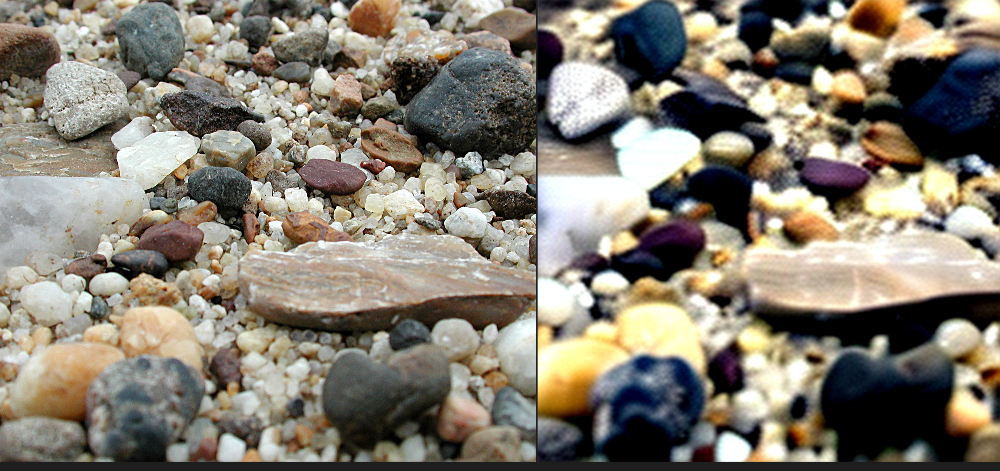

In [11]:
# Change these parameters
input_image = "experiments/rocks.jpg" # put your image path here
prompt = ""
cfg = 1.0
steps = 4
seed = 42

out_path, orig, gen = run_pipeline(
    input_image,
    prompt=prompt,
    cfg_scale=cfg,
    steps=steps,
    seed=seed,
    cond_scale=1.0 # 1.0 is normal conditioning, but can at times reduce the quality of the output, adjust accordingly to find a balance between quality and faithfulness to the input video
)

# Display result
display(IPyImage(str(out_path)))

In [12]:
input_video = "experiments/input.mp4"
prompt = ""

out_path, _, _ = run_pipeline(
    input_video,
    prompt=prompt,
    steps=4,
    video_fps=5, # 0 = original fps, or set to a target fps like 5 or 10 for faster processing
    cond_scale=0.8
)

# Display video
display(Video(str(out_path), embed=True))

Extracted 60 frames @ 5.98 fps


V-JEPA encode:   0%|          | 0/60 [00:00<?, ?it/s]

Generating:   0%|          | 0/60 [00:00<?, ?it/s]

✓ Saved: experiments\outputs\input_sbs_225027.mp4
